In [5]:
# sediment_correction_expand_crop_full_fix.py
# -*- coding: utf-8 -*-
from __future__ import annotations

import tempfile
from dataclasses import dataclass
from pathlib import Path
from typing import Optional, Sequence

import numpy as np
import xarray as xr
import pygmt
from pygmt.clib import Session


@dataclass
class Config:
    target_region: tuple[float, float, float, float] = (111.0, 117.0, 14.5, 18.5)
    buffer_deg_lon: float = 5.0
    buffer_deg_lat: float = 5.0

    rho_water: float = 1030.0
    rho_crust: float = 2800.0
    rho_sed0: float = 2300.0
    rho_sed_scenarios: Sequence[float] = (2200.0, 2300.0, 2400.0)

    nterms: int = 8
    taper_percent: int = 15
    extension_mode: str = "m"
    fft_mode: str = "a"
    detrend_mode: str = "a"
    field_opt: str = "f+s"

    cba_raw_nc: Path = Path(r"E:\wjy\Gravity\SCS_Gravity\out\Outdata\CBA_expand_crop\CBA_raw_expand5.0deg_5.0deg.nc")
    cba_var: Optional[str] = None
    g_wc_var: Optional[str] = None

    sed_thickness_nc: Path = Path(r"E:\wjy\Gravity\SCS_Gravity\data\GlobSed\globsed_SCS_01m_like.nc")
    sed_var: Optional[str] = None
    sed_clip_min_m: float = 0.0

    fetch_resolution: str = "01m"
    fetch_reg_preference: str = "g"
    force_match_to_faa: bool = True

    out_dir: Path = Path(r"E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop")

    max_nan_frac_allowed: float = 0.02

    make_png: bool = False  # 你先把数值跑通，后面再开
    cmap: str = "turbo"
    map_proj: str = "M12c"
    dpi: int = 300

    gmt_verbose_level: str = "n"
    keep_temp_dir: bool = True


def _expand_region(region: tuple[float, float, float, float], dlon: float, dlat: float) -> tuple[float, float, float, float]:
    w, e, s, n = region
    return (w - dlon, e + dlon, s - dlat, n + dlat)


def _guess_grid_var(ds: xr.Dataset, preferred: list[str]) -> str:
    for name in preferred:
        if name in ds.data_vars:
            return name
    for vname, da in ds.data_vars.items():
        if da.ndim == 2:
            return vname
    raise ValueError(f"Cannot find a 2D grid var in dataset. data_vars={list(ds.data_vars)}")


def _standardize_lonlat_da(da: xr.DataArray) -> xr.DataArray:
    if "lon" not in da.coords and "x" in da.coords:
        da = da.rename({"x": "lon"})
    if "lat" not in da.coords and "y" in da.coords:
        da = da.rename({"y": "lat"})
    if "lon" not in da.coords or "lat" not in da.coords:
        raise ValueError(f"Grid missing lon/lat coords, coords={list(da.coords)}")

    if np.any(np.diff(da["lon"].values) < 0):
        da = da.sortby("lon")
    if np.any(np.diff(da["lat"].values) < 0):
        da = da.sortby("lat")
    return da


def _subset_region_da(da: xr.DataArray, region: tuple[float, float, float, float]) -> xr.DataArray:
    w, e, s, n = region
    da = _standardize_lonlat_da(da)
    return da.sel(lon=slice(w, e), lat=slice(s, n))


def _grid_step_deg(coord: xr.DataArray) -> float:
    v = np.asarray(coord.values, dtype=float)
    dv = np.diff(v)
    dv = dv[np.isfinite(dv)]
    if dv.size == 0:
        raise ValueError("Cannot determine grid step (empty diffs).")
    return float(np.median(np.abs(dv)))


def _require_nan_frac_below(name: str, da: xr.DataArray, max_nan_frac: float) -> None:
    v = da.values
    frac = np.isnan(v).sum() / v.size
    print(f"[QC] {name}: NaN fraction = {frac:.3%}")
    if frac > max_nan_frac:
        raise ValueError(f"{name}: NaN fraction too high ({frac:.3%} > {max_nan_frac:.3%}).")


def _qc_stats(name: str, da: xr.DataArray) -> None:
    v = da.values
    print(
        f"[QC] {name}: min={float(np.nanmin(v)):.3f} "
        f"max={float(np.nanmax(v)):.3f} mean={float(np.nanmean(v)):.3f} std={float(np.nanstd(v)):.3f}"
    )


def _describe_extent(name: str, da: xr.DataArray) -> None:
    da = _standardize_lonlat_da(da)
    lon_min = float(np.nanmin(da.lon.values))
    lon_max = float(np.nanmax(da.lon.values))
    lat_min = float(np.nanmin(da.lat.values))
    lat_max = float(np.nanmax(da.lat.values))
    units = str(da.attrs.get("units", ""))
    print(f"[QC] {name} extent: lon[{lon_min:.6f},{lon_max:.6f}] lat[{lat_min:.6f},{lat_max:.6f}] "
          f"shape=({da.sizes['lat']},{da.sizes['lon']}) units='{units}'")


def _require_region_overlap(name: str, da: xr.DataArray, region: tuple[float, float, float, float]) -> None:
    da = _standardize_lonlat_da(da)
    w, e, s, n = region
    lon_min = float(da.lon.min())
    lon_max = float(da.lon.max())
    lat_min = float(da.lat.min())
    lat_max = float(da.lat.max())

    overlap_lon = (lon_max >= w) and (lon_min <= e)
    overlap_lat = (lat_max >= s) and (lat_min <= n)
    if not (overlap_lon and overlap_lat):
        raise ValueError(
            f"{name} does NOT overlap requested region.\n"
            f"  grid lon=[{lon_min},{lon_max}] lat=[{lat_min},{lat_max}]\n"
            f"  want lon=[{w},{e}] lat=[{s},{n}]"
        )


def _force_same_coords_like(src: xr.DataArray, tmpl: xr.DataArray, name: str) -> xr.DataArray:
    """
    让 src 的 lon/lat 坐标与 tmpl 完全一致（逐元素相等），避免 xarray join='exact' 报错。
    """
    src = _standardize_lonlat_da(src)
    tmpl = _standardize_lonlat_da(tmpl)

    same_shape = (src.sizes["lon"] == tmpl.sizes["lon"]) and (src.sizes["lat"] == tmpl.sizes["lat"])
    if same_shape:
        out = src.assign_coords(lon=tmpl.lon.values, lat=tmpl.lat.values)
        print(f"[QC] {name}: force coords = template (assign_coords).")
        return out

    print(f"[QC] {name}: shape differs -> interp to template.")
    return src.interp(lon=tmpl.lon, lat=tmpl.lat, method="linear")


def _to_tmp_grid(da: xr.DataArray, outpath: Path) -> None:
    da2 = _standardize_lonlat_da(da.astype(np.float32))
    ds = da2.to_dataset(name="z").rename({"lon": "x", "lat": "y"})
    ds.to_netcdf(outpath, engine="scipy")


def _read_grid(path: Path) -> xr.DataArray:
    ds = xr.open_dataset(path)
    da = ds[_guess_grid_var(ds, preferred=["z"])]
    ds.close()
    return _standardize_lonlat_da(da)


def _snap_or_interp_like(da: xr.DataArray, tmpl: xr.DataArray, name: str) -> xr.DataArray:
    da = _standardize_lonlat_da(da)
    tmpl = _standardize_lonlat_da(tmpl)

    lon_ok = (da.sizes["lon"] == tmpl.sizes["lon"]) and np.allclose(da.lon.values, tmpl.lon.values, atol=1e-10, rtol=0)
    lat_ok = (da.sizes["lat"] == tmpl.sizes["lat"]) and np.allclose(da.lat.values, tmpl.lat.values, atol=1e-10, rtol=0)

    if lon_ok and lat_ok:
        print(f"[QC] {name}: coords match template; skip interpolation.")
        return da.assign_coords(lon=tmpl.lon.values, lat=tmpl.lat.values)

    print(f"[QC] {name}: coords differ; do linear interpolation.")
    return da.interp(lon=tmpl.lon, lat=tmpl.lat, method="linear")


def _infer_registration_from_lon(lon: xr.DataArray) -> str:
    dx = _grid_step_deg(lon)
    frac = (float(lon.min()) / dx) - np.floor(float(lon.min()) / dx)
    return "p" if abs(frac - 0.5) < 1e-2 else "g"


def _load_da_from_nc(path: Path, var: Optional[str], preferred: list[str]) -> xr.DataArray:
    ds = xr.open_dataset(path)
    if var is None:
        vname = _guess_grid_var(ds, preferred=preferred)
    else:
        if var not in ds.data_vars:
            raise ValueError(f"Variable '{var}' not found in {path}. data_vars={list(ds.data_vars)}")
        vname = var
    da = ds[vname]
    ds.close()
    return _standardize_lonlat_da(da)


def _maybe_convert_sed_units_to_m(sed: xr.DataArray) -> xr.DataArray:
    units = str(sed.attrs.get("units", "")).lower()
    if "km" in units:
        print("[INFO] Sediment thickness units appear to be km -> convert to m (*1000).")
        sed = sed * 1000.0
        sed.attrs["units"] = "m"
    else:
        if units.strip() == "":
            print("[WARN] Sediment thickness has no 'units' attr; assume meters (m).")
    return sed


def _grdcut_remote(dataset: str, region: tuple[float, float, float, float], out_nc: Path) -> None:
    w, e, s, n = region
    out_nc.parent.mkdir(parents=True, exist_ok=True)
    pygmt.grdcut(grid=dataset, region=[w, e, s, n], outgrid=out_nc.as_posix(), verbose="q")
    if not out_nc.exists():
        raise FileNotFoundError(f"grdcut did not create output: {out_nc}")


def _grdcut_remote_with_fallback(base: str, res: str, reg_pref: str, region: tuple[float, float, float, float], out_nc: Path) -> str:
    candidates = [f"@{base}_{res}_{reg_pref}", f"@{base}_{res}"]
    if reg_pref == "g":
        candidates.append(f"@{base}_{res}_p")
    else:
        candidates.append(f"@{base}_{res}_g")

    last_err = None
    for dsname in candidates:
        try:
            print(f"[INFO] Trying remote dataset: {dsname}")
            _grdcut_remote(dsname, region, out_nc)
            print(f"[INFO] Success: {dsname}")
            return dsname
        except Exception as e:
            last_err = e
            print(f"[WARN] Failed: {dsname} ({type(e).__name__}: {e})")
    raise RuntimeError(f"All remote dataset candidates failed for {base}_{res}. Last error: {last_err}")


def _resample_grid_to_template_file(src_grid_nc: Path, tmpl: xr.DataArray, out_nc: Path, registration: str) -> None:
    tmpl = _standardize_lonlat_da(tmpl)
    dx = _grid_step_deg(tmpl.lon)
    dy = _grid_step_deg(tmpl.lat)
    region = [float(tmpl.lon.min()), float(tmpl.lon.max()), float(tmpl.lat.min()), float(tmpl.lat.max())]

    out_nc.parent.mkdir(parents=True, exist_ok=True)
    print(f"[INFO] grdsample -> match template: {src_grid_nc.name} -> {out_nc.name}  reg={registration} dx={dx} dy={dy}")
    pygmt.grdsample(
        grid=str(src_grid_nc),
        outgrid=str(out_nc),
        region=region,
        spacing=[dx, dy],
        registration=registration,
        interpolation="b",
        verbose="q",
    )
    if not out_nc.exists():
        raise FileNotFoundError(f"grdsample did not create output: {out_nc}")


def load_faa_and_relief_expanded(cfg: Config, region_exp: tuple[float, float, float, float]) -> tuple[xr.DataArray, xr.DataArray]:
    cfg.out_dir.mkdir(parents=True, exist_ok=True)
    res = cfg.fetch_resolution
    pref = cfg.fetch_reg_preference

    faa_nc = cfg.out_dir / f"faa_{res}_expanded_{region_exp[0]:.1f}_{region_exp[1]:.1f}_{region_exp[2]:.1f}_{region_exp[3]:.1f}.nc"
    rel_nc = cfg.out_dir / f"relief_{res}_expanded_{region_exp[0]:.1f}_{region_exp[1]:.1f}_{region_exp[2]:.1f}_{region_exp[3]:.1f}.nc"

    faa_ds_used = _grdcut_remote_with_fallback("earth_faa", res, pref, region_exp, faa_nc)
    rel_ds_used = _grdcut_remote_with_fallback("earth_relief", res, pref, region_exp, rel_nc)
    print(f"[INFO] FAA dataset used: {faa_ds_used}")
    print(f"[INFO] Relief dataset used: {rel_ds_used}")

    faa = _load_da_from_nc(faa_nc, var=None, preferred=["z", "faa", "FAA"])
    relief = _load_da_from_nc(rel_nc, var=None, preferred=["z", "elevation", "topo", "bathy"])

    if cfg.force_match_to_faa:
        reg = _infer_registration_from_lon(faa.lon)
        rel_rs_nc = cfg.out_dir / f"relief_{res}_expanded_MATCHFAA_{reg}.nc"
        _resample_grid_to_template_file(rel_nc, faa, rel_rs_nc, registration=reg)
        relief = _load_da_from_nc(rel_rs_nc, var=None, preferred=["z", "elevation", "topo", "bathy"])

    return faa, relief


def gmt_gravfft(
    ingrid_nc: Path,
    outgrid_nc: Path,
    drho: float,
    cfg: Config,
) -> None:
    Nopt = f"-N{cfg.fft_mode}+{cfg.detrend_mode}+{cfg.extension_mode}+t{cfg.taper_percent}+v"
    cmd = " ".join([
        ingrid_nc.as_posix(),
        f"-D{drho}",
        f"-G{outgrid_nc.as_posix()}",
        f"-E{cfg.nterms}",
        f"-F{cfg.field_opt}",
        Nopt,
        "-fg",
        f"-V{cfg.gmt_verbose_level}",
    ])
    print("[GMT] gravfft", cmd)
    with Session() as ses:
        ses.call_module("gravfft", cmd)
    if not outgrid_nc.exists():
        raise FileNotFoundError(f"gravfft did not create output grid: {outgrid_nc}")


def sediment_correction_expand_then_crop(cfg: Config) -> None:
    cfg.out_dir.mkdir(parents=True, exist_ok=True)

    # ---- 1) read CBA_raw and g_wc from file ----
    ds_cba = xr.open_dataset(cfg.cba_raw_nc)
    cba_var = _guess_grid_var(ds_cba, preferred=["CBA_raw", "cba_raw", "z"]) if cfg.cba_var is None else cfg.cba_var
    if cfg.g_wc_var is None:
        g_wc_var = "g_wc" if "g_wc" in ds_cba.data_vars else None
    else:
        g_wc_var = cfg.g_wc_var

    cba_raw_tgt = _standardize_lonlat_da(ds_cba[cba_var])
    g_wc_tgt = _standardize_lonlat_da(ds_cba[g_wc_var]) if (g_wc_var is not None and g_wc_var in ds_cba.data_vars) else None
    ds_cba.close()

    print(f"[INFO] Using CBA var: {cba_var}")
    print(f"[INFO] Using g_wc var: {g_wc_var if g_wc_tgt is not None else 'None (will recompute)'}")
    _qc_stats("CBA_raw(tgt)", cba_raw_tgt)
    if g_wc_tgt is not None:
        _qc_stats("g_wc(tgt)", g_wc_tgt)

    # ---- 2) expanded region: load FAA template & relief ----
    region_exp = _expand_region(cfg.target_region, cfg.buffer_deg_lon, cfg.buffer_deg_lat)
    print("Target region:", cfg.target_region)
    print("Expanded region:", region_exp)

    faa_exp, relief_exp = load_faa_and_relief_expanded(cfg, region_exp)
    tmpl_exp = _standardize_lonlat_da(faa_exp)

    bathy_exp = _standardize_lonlat_da(relief_exp)
    # ===== 修改点 A：强制 bathy 的坐标与 FAA 模板完全一致（避免 join='exact' 报错）=====
    bathy_exp = _force_same_coords_like(bathy_exp, tmpl_exp, "Bathy(expanded)->tmpl_exp")
    # ===========================================================================
    _require_nan_frac_below("Bathy(expanded)", bathy_exp, cfg.max_nan_frac_allowed)
    _qc_stats("Bathy(expanded)", bathy_exp)

    # ---- 3) load sediment thickness with coverage checks ----
    sed0 = _load_da_from_nc(cfg.sed_thickness_nc, cfg.sed_var, preferred=["thick", "thickness", "sed", "z"])
    sed0 = _maybe_convert_sed_units_to_m(sed0)

    _describe_extent("Sed_thickness(input)", sed0)
    _require_region_overlap("Sed_thickness(input)", sed0, region_exp)

    sed0 = _subset_region_da(sed0, region_exp)
    sed0 = sed0.interp(lon=tmpl_exp.lon, lat=tmpl_exp.lat, method="linear")
    sed0 = sed0.clip(min=cfg.sed_clip_min_m).fillna(0.0)
    # ===== 修改点 B：强制 sed 的坐标与 FAA 模板完全一致（避免 join='exact' 报错）=====
    sed0 = _force_same_coords_like(sed0, tmpl_exp, "Sed_thickness(expanded)->tmpl_exp")
    # ===========================================================================
    _require_nan_frac_below("Sed_thickness(expanded)", sed0, cfg.max_nan_frac_allowed)
    _qc_stats("Sed_thickness(expanded) [m]", sed0)

    # thickness QC
    sed_vals = sed0.values
    p95 = float(np.nanpercentile(sed_vals, 95))
    p99 = float(np.nanpercentile(sed_vals, 99))
    frac_gt8 = float(np.nanmean(sed_vals > 8000.0))
    frac_gt10 = float(np.nanmean(sed_vals > 10000.0))
    print(f"[QC] Sed_thickness percentiles: p95={p95:.1f} m, p99={p99:.1f} m")
    print(f"[QC] Sed_thickness fractions: >8km={frac_gt8:.3%}, >10km={frac_gt10:.3%}")

    # ---- 4) interfaces on expanded grid (NOW SAFE) ----
    ocean_mask = bathy_exp < 0.0
    seafloor = bathy_exp.where(ocean_mask, 0.0)
    basement = (bathy_exp - sed0).where(ocean_mask, 0.0)
    basement = basement.where(basement < 0.0, 0.0)

    _qc_stats("Seafloor(expanded)", seafloor)
    _qc_stats("Basement(expanded)", basement)
    clipped_frac = float(np.nanmean((ocean_mask.values) & (basement.values == 0.0)))
    print(f"[QC] Basement clipped-to-0 fraction in ocean = {clipped_frac:.3%} (should be ~0%)")

    # ---- 5) gravfft on expanded ----
    if not (cfg.rho_water < cfg.rho_sed0 < cfg.rho_crust):
        raise ValueError("Require rho_water < rho_sed0 < rho_crust.")
    drho_ws0 = cfg.rho_sed0 - cfg.rho_water
    drho_sc0 = cfg.rho_crust - cfg.rho_sed0
    drho_wc = cfg.rho_crust - cfg.rho_water

    td = Path(tempfile.mkdtemp(prefix="sed_gravfft_"))
    print("[INFO] Using temp dir:", td)

    seafloor_nc = td / "seafloor.nc"
    basement_nc = td / "basement.nc"
    _to_tmp_grid(seafloor, seafloor_nc)
    _to_tmp_grid(basement, basement_nc)

    g_ws_nc = td / "g_ws.nc"
    g_sc_nc = td / "g_sc.nc"
    gmt_gravfft(seafloor_nc, g_ws_nc, drho_ws0, cfg)
    gmt_gravfft(basement_nc, g_sc_nc, drho_sc0, cfg)

    g_ws_exp = _read_grid(g_ws_nc)
    g_sc_exp = _read_grid(g_sc_nc)
    g_ws_exp = _force_same_coords_like(g_ws_exp, tmpl_exp, "g_ws(expanded)->tmpl_exp")
    g_sc_exp = _force_same_coords_like(g_sc_exp, tmpl_exp, "g_sc(expanded)->tmpl_exp")
    _qc_stats("g_ws(expanded)", g_ws_exp)
    _qc_stats("g_sc(expanded)", g_sc_exp)

    if g_wc_tgt is None:
        g_wc_nc = td / "g_wc.nc"
        gmt_gravfft(seafloor_nc, g_wc_nc, drho_wc, cfg)
        g_wc_exp = _read_grid(g_wc_nc)
        g_wc_exp = _force_same_coords_like(g_wc_exp, tmpl_exp, "g_wc(expanded)->tmpl_exp")
    else:
        g_wc_exp = None

    # ---- 6) crop to target & align to target template (CBA grid) ----
    w, e, s, n = cfg.target_region
    tmpl_tgt = cba_raw_tgt

    g_ws_tgt = _snap_or_interp_like(g_ws_exp.sel(lon=slice(w, e), lat=slice(s, n)), tmpl_tgt, "g_ws(tgt)")
    g_sc_tgt = _snap_or_interp_like(g_sc_exp.sel(lon=slice(w, e), lat=slice(s, n)), tmpl_tgt, "g_sc(tgt)")
    if g_wc_tgt is None:
        g_wc_tgt = _snap_or_interp_like(g_wc_exp.sel(lon=slice(w, e), lat=slice(s, n)), tmpl_tgt, "g_wc(tgt) [recomputed]")

    # ---- 7) sediment correction and output ----
    sed_corr0 = g_wc_tgt - (g_ws_tgt + g_sc_tgt)
    cba_sed0 = cba_raw_tgt + sed_corr0
    _qc_stats("sed_corr0(tgt)", sed_corr0)
    _qc_stats("CBA_sed0(tgt)", cba_sed0)

    # sensitivity
    Gsf = g_ws_tgt / drho_ws0
    Gbs = g_sc_tgt / drho_sc0
    dCBA_drho = (Gbs - Gsf)
    _qc_stats("dCBA_drho_sed(tgt)", dCBA_drho)

    # scenarios (no rerun)
    scen_vars = {}
    for rho in cfg.rho_sed_scenarios:
        if not (cfg.rho_water < rho < cfg.rho_crust):
            continue
        sed_corr = g_wc_tgt - (Gsf * (rho - cfg.rho_water) + Gbs * (cfg.rho_crust - rho))
        cba_sed = cba_raw_tgt + sed_corr
        scen_vars[f"CBA_sed_rho{int(rho)}"] = cba_sed.astype("float32")
        scen_vars[f"sed_corr_rho{int(rho)}"] = sed_corr.astype("float32")

    out_nc = cfg.out_dir / f"CBA_sed_expand{cfg.buffer_deg_lon:.1f}deg_{cfg.buffer_deg_lat:.1f}deg_rho{int(cfg.rho_sed0)}.nc"
    xr.Dataset(
        data_vars=dict(
            CBA_raw=cba_raw_tgt.astype("float32"),
            g_wc=g_wc_tgt.astype("float32"),
            g_ws=g_ws_tgt.astype("float32"),
            g_sc=g_sc_tgt.astype("float32"),
            sed_corr=sed_corr0.astype("float32"),
            CBA_sed=cba_sed0.astype("float32"),
            dCBA_drho_sed=dCBA_drho.astype("float32"),
            **scen_vars,
        ),
        coords=dict(lon=tmpl_tgt.lon, lat=tmpl_tgt.lat),
    ).to_netcdf(out_nc)
    print("Saved:", out_nc)

    if not cfg.keep_temp_dir:
        try:
            for p in td.glob("*"):
                p.unlink()
            td.rmdir()
        except Exception as e:
            print("[WARN] Failed to remove temp dir:", td, e)


def main() -> None:
    cfg = Config()
    cfg.out_dir.mkdir(parents=True, exist_ok=True)
    print(cfg)
    sediment_correction_expand_then_crop(cfg)


if __name__ == "__main__":
    main()


Config(target_region=(111.0, 117.0, 14.5, 18.5), buffer_deg_lon=5.0, buffer_deg_lat=5.0, rho_water=1030.0, rho_crust=2800.0, rho_sed0=2300.0, rho_sed_scenarios=(2200.0, 2300.0, 2400.0), nterms=8, taper_percent=15, extension_mode='m', fft_mode='a', detrend_mode='a', field_opt='f+s', cba_raw_nc=WindowsPath('E:/wjy/Gravity/SCS_Gravity/out/Outdata/CBA_expand_crop/CBA_raw_expand5.0deg_5.0deg.nc'), cba_var=None, g_wc_var=None, sed_thickness_nc=WindowsPath('E:/wjy/Gravity/SCS_Gravity/data/GlobSed/globsed_SCS_01m_like.nc'), sed_var=None, sed_clip_min_m=0.0, fetch_resolution='01m', fetch_reg_preference='g', force_match_to_faa=True, out_dir=WindowsPath('E:/wjy/Gravity/SCS_Gravity/out/Outdata/Sediment_Correction_expand_crop'), max_nan_frac_allowed=0.02, make_png=False, cmap='turbo', map_proj='M12c', dpi=300, gmt_verbose_level='n', keep_temp_dir=True)
[INFO] Using CBA var: CBA_raw
[INFO] Using g_wc var: g_wc
[QC] CBA_raw(tgt): min=31.629 max=363.261 mean=212.305 std=89.161
[QC] g_wc(tgt): min=-315

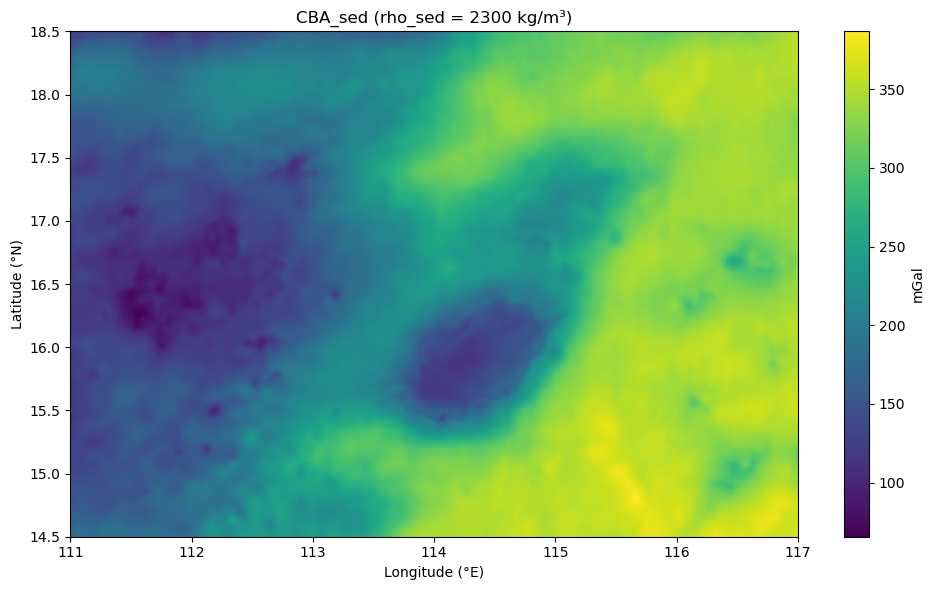

In [6]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

nc = r"E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\CBA_sed_expand5.0deg_5.0deg_rho2300.nc"
ds = xr.open_dataset(nc)

da = ds["CBA_sed"].load()
lon = da["lon"].values
lat = da["lat"].values
Lon, Lat = np.meshgrid(lon, lat)

plt.figure(figsize=(10, 6))
plt.pcolormesh(Lon, Lat, da.values, shading="auto")
cbar = plt.colorbar()
cbar.set_label("mGal")
plt.xlabel("Longitude (°E)")
plt.ylabel("Latitude (°N)")
plt.title("CBA_sed (rho_sed = 2300 kg/m³)")
plt.tight_layout()
plt.savefig("E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\CBA_sed_map_rho2300.png", dpi=600)
plt.show()



In [7]:
import os
import zipfile
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from PIL import Image

NC_PATH = r"E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\CBA_sed_expand5.0deg_5.0deg_rho2300.nc"
OUT_DIR = r"E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\pic"
ZIP_OUT = os.path.join(os.path.dirname(OUT_DIR), "Paper_Figures_CBA_sed.zip")

os.makedirs(OUT_DIR, exist_ok=True)

def robust_limits(a, p=2.0):
    v = np.asarray(a)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (0.0, 1.0)
    lo = np.nanpercentile(v, p)
    hi = np.nanpercentile(v, 100.0 - p)
    if np.isclose(lo, hi):
        lo = float(np.nanmin(v)); hi = float(np.nanmax(v))
        if np.isclose(lo, hi):
            lo, hi = lo - 1.0, hi + 1.0
    return float(lo), float(hi)

def symmetric_limits(a, p=2.0):
    lo, hi = robust_limits(a, p=p)
    m = max(abs(lo), abs(hi))
    return -m, m

def _to_lonlat_mesh(da):
    lon = da["lon"].values
    lat = da["lat"].values
    return np.meshgrid(lon, lat)

def save_map_png_tiff(da, title, fname, symmetric=False, robust_p=2.0, unit="mGal", max_points=1_000_000):
    da = da.load()
    ny, nx = da.sizes["lat"], da.sizes["lon"]
    npts = ny * nx
    if npts > max_points:
        factor = int(np.ceil(np.sqrt(npts / max_points)))
        da_plot = da.isel(lat=slice(0, ny, factor), lon=slice(0, nx, factor))
    else:
        da_plot = da

    Z = da_plot.values
    Lon, Lat = _to_lonlat_mesh(da_plot)

    if symmetric:
        vmin, vmax = symmetric_limits(Z, p=robust_p)
    else:
        vmin, vmax = robust_limits(Z, p=robust_p)

    plt.figure(figsize=(7.2, 6.2))
    pcm = plt.pcolormesh(Lon, Lat, Z, shading="auto", vmin=vmin, vmax=vmax)  # 不指定 cmap，保持默认
    cbar = plt.colorbar(pcm)
    cbar.set_label(unit)
    plt.xlabel("Longitude (°E)")
    plt.ylabel("Latitude (°N)")
    plt.title(title)
    plt.tight_layout()

    png = os.path.join(OUT_DIR, f"{fname}.png")
    tiff = os.path.join(OUT_DIR, f"{fname}.tif")
    plt.savefig(png, dpi=300)
    plt.close()

    Image.open(png).save(tiff, compression="tiff_lzw")
    return png, tiff

def save_hist(da, title, fname, unit="mGal", bins=90):
    v = np.asarray(da.values).ravel()
    v = v[np.isfinite(v)]
    plt.figure(figsize=(7.2, 4.6))
    plt.hist(v, bins=bins)
    plt.xlabel(unit)
    plt.ylabel("Count")
    plt.title(title)
    plt.tight_layout()
    png = os.path.join(OUT_DIR, f"{fname}.png")
    tiff = os.path.join(OUT_DIR, f"{fname}.tif")
    plt.savefig(png, dpi=300)
    plt.close()
    Image.open(png).save(tiff, compression="tiff_lzw")
    return png, tiff

def save_scatter(x, y, title, fname, xlabel, ylabel, max_points=200_000):
    xv = np.asarray(x.values).ravel()
    yv = np.asarray(y.values).ravel()
    m = np.isfinite(xv) & np.isfinite(yv)
    xv, yv = xv[m], yv[m]
    if xv.size > max_points:
        idx = np.random.default_rng(0).choice(xv.size, size=max_points, replace=False)
        xv, yv = xv[idx], yv[idx]
    plt.figure(figsize=(6.6, 5.6))
    plt.scatter(xv, yv, s=3)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.tight_layout()
    png = os.path.join(OUT_DIR, f"{fname}.png")
    tiff = os.path.join(OUT_DIR, f"{fname}.tif")
    plt.savefig(png, dpi=300)
    plt.close()
    Image.open(png).save(tiff, compression="tiff_lzw")
    return png, tiff

def main():
    ds = xr.open_dataset(NC_PATH)

    # Core maps
    map_specs = [
        ("CBA_raw", "CBA_raw", False, "mGal"),
        ("CBA_sed", "CBA_sed (ρ_sed=2300 kg/m³)", False, "mGal"),
        ("sed_corr", "Sediment correction term: sed_corr", True, "mGal"),
        ("g_wc", "g_wc", True, "mGal"),
        ("g_ws", "g_ws (ρ_sed-ρ_water)", True, "mGal"),
        ("g_sc", "g_sc (ρ_crust-ρ_sed)", True, "mGal"),
        ("dCBA_drho_sed", "Sensitivity: dCBA/dρ_sed", True, "mGal / (kg m$^{-3}$)"),
    ]
    for var, title, sym, unit in map_specs:
        save_map_png_tiff(ds[var], title, f"map_{var}", symmetric=sym, unit=unit)

    # Sensitivity scaled: Δrho=100
    d100 = (ds["dCBA_drho_sed"] * 100.0).astype("float32")
    save_map_png_tiff(d100, "dCBA due to Δρ_sed = 100 kg/m³", "map_dCBA_dRho100", symmetric=True, unit="mGal")

    # Scenario maps + diff
    for rho in (2200, 2300, 2400):
        var = f"CBA_sed_rho{rho}"
        save_map_png_tiff(ds[var], f"CBA_sed (ρ_sed={rho} kg/m³)", f"map_{var}", symmetric=False, unit="mGal")

    diff = (ds["CBA_sed_rho2400"] - ds["CBA_sed_rho2200"]).astype("float32")
    save_map_png_tiff(diff, "CBA_sed(2400) − CBA_sed(2200)", "map_CBA_sed_diff_2400_2200", symmetric=True, unit="mGal")

    # Histograms
    save_hist(ds["CBA_raw"], "Histogram: CBA_raw", "hist_CBA_raw", unit="mGal")
    save_hist(ds["CBA_sed"], "Histogram: CBA_sed", "hist_CBA_sed", unit="mGal")
    save_hist(ds["sed_corr"], "Histogram: sed_corr", "hist_sed_corr", unit="mGal")
    save_hist(ds["dCBA_drho_sed"], "Histogram: dCBA/dρ_sed", "hist_dCBA_drho_sed", unit="mGal/(kg m$^{-3}$)")

    # Scatter
    save_scatter(ds["sed_corr"], ds["CBA_sed"], "CBA_sed vs sediment correction",
                 "scatter_CBA_sed_vs_sed_corr", "sed_corr (mGal)", "CBA_sed (mGal)")
    save_scatter(ds["sed_corr"], ds["CBA_raw"], "CBA_raw vs sediment correction",
                 "scatter_CBA_raw_vs_sed_corr", "sed_corr (mGal)", "CBA_raw (mGal)")

    # Zip outputs
    with zipfile.ZipFile(ZIP_OUT, "w", compression=zipfile.ZIP_DEFLATED) as z:
        for fn in os.listdir(OUT_DIR):
            z.write(os.path.join(OUT_DIR, fn), arcname=fn)

    print("Done. Figures in:", OUT_DIR)
    print("Zip saved:", ZIP_OUT)

if __name__ == "__main__":
    main()


Done. Figures in: E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\pic
Zip saved: E:\wjy\Gravity\SCS_Gravity\out\Outdata\Sediment_Correction_expand_crop\Paper_Figures_CBA_sed.zip
